# Computer Vision - P4

### **Carefully read the file `README.md` as well as the following instructions before start coding.**

## Delivery

Up to **1 point out of 10** will be penalized if the following requirements are not fulfilled:

- Implemented code should be commented.

- The questions introduced in the exercises must be answered.

- Add title to the figures to explain what is displayed.

- Comments and answers need to be in **English**.

- The deliverable must be a file named **P4_Student1_Student2.zip** that includes:
    - The notebook P4_Student1_Student2.ipynb completed with the solutions to the exercises and their corresponding comments.

**Deadline (Campus Virtual): November 22th, 23:00 h** 

==============================================================================================
## Descriptors extraction for object detection, based on template matching, ORB, and HOG
==============================================================================================

The main topics of Laboratory 4 are:

    4.1) SSD and Normalized Cross-correlation for template matching

    4.2) HOG image descriptor for object (person) detection

    4.3) Recognition by correspondance, based on feature extraction (ORB)

In order to complete this practicum, the following concepts need to be understood: template matching, feature localization (Harris, Censure), feature descriptor (HOG,ORB, Sift) methods.

It is highly recommendable to structure the code in functions in order to reuse code for different tests and images and make it shorter and more readable. Specially the visualization commands should be encapsulated in separate functions.

## 1 Template matching

**1.1** Given the image 'einstein.png' and the template image 'eye.png', detect the location of the template in the image comparing the use of:
- SSD distance (hint: norm() in numpy.linalg).
- normalized cross-correlation (hint: match_template() of skimage.feature).

Don't forget to normalize the images (having pixel values between [0,1]) before comparing them.

In [1]:
# Your solution here
# Imports that we going to use along the notebook
from skimage import io, data, exposure
from skimage import img_as_float
from skimage.feature import match_template, hog
from matplotlib import pyplot as plt
from skimage.color import rgb2gray
from skimage.transform import rotate
from skimage import transform
from skimage.feature import match_descriptors, corner_harris, corner_peaks, ORB, plot_matches
import random
import numpy as np

%matplotlib inline



eye = rgb2gray(io.imread('./images/eye.png'))



einstein = rgb2gray(io.imread('./images/einstein.png'))



Create a function for template matching applying SSD distance and normalized cross-correlation and display the results in the following format:
    

**Use titles in all figures to understand what is being displayed.**

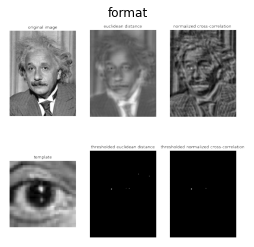

In [2]:
tm=io.imread("images_notebook/tm.png")
plt.axis('off')
plt.title("format")
plt.imshow(tm)

In [3]:
def ssd_distance(image, template):
    
    ix, iy = image.shape
    tx, ty = template.shape
    
    # Resulting image will have different dimension to the original one. It will be reduced by the size
    # of the template.
    result = np.zeros((ix - tx, iy - ty))
    # Calculate ssd 
    ssd = (lambda a, b: np.linalg.norm(a - b))
    for r in range(ix - tx):
        # Distance between each cell (size of template) and the template.
        result[r] = [ssd(image[r:r + tx, c:c + ty], template) for c in range(iy - ty)]
    
    # Returned image is normalized as required in the exercise.
    return result/np.max(result)
    
def normalized_correlation_match(image, template):
    
    result = match_template(image, template)
    # Returned image is normalized as required in the exercise.
    return result/np.max(result)
    
def plot_n_images(n, images, titles, fig_title=None, cmap=None):
    
    fig, axs = plt.subplots(1, n)
    fig.set_size_inches(10, 10)
    if fig_title: print(fig_title)
    #fig.suptitle(fig_title)
    # Plots images with title and no axis.
    for i in range(n):
        axs[i].axis('off')
        axs[i].imshow(images[i], cmap)
        axs[i].set_title(titles[i])

    plt.show()

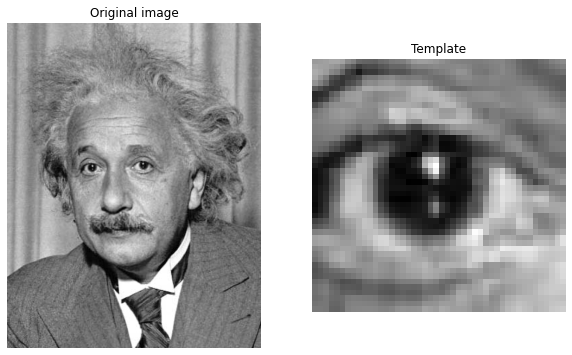

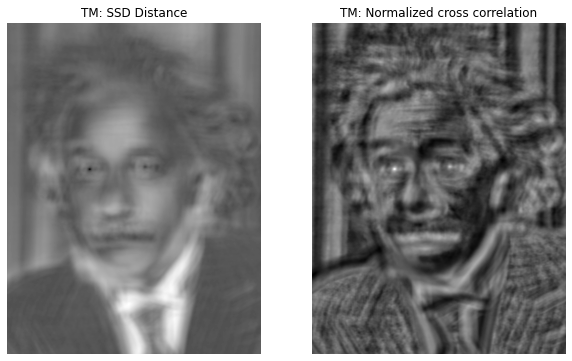

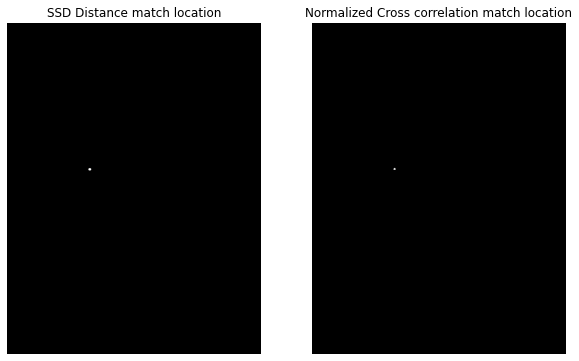

In [4]:
ssd = ssd_distance(einstein, eye) 
ncr = normalized_correlation_match(einstein, eye)

plot_n_images(2, [einstein, eye], ["Original image", "Template"], "", 'gray')
plot_n_images(2, [ssd, ncr], ["TM: SSD Distance", "TM: Normalized cross correlation"], "", 'gray')
# Using a mask, the template match location can be extracted for later comparison.
plot_n_images(2, [ssd < 0.3, ncr > 0.8], ["SSD Distance match location", "Normalized Cross correlation match location"], "", 'gray')

**1.2** How does the result of the template matching change if the image changes its contrast (for example if you make it clearer or darker)? 

Similarly to the previous case, please, visualize the euclidean distance and normalized cross-correlation images as well as the binarized (thresholded) images in the two cases.

**Note:** Use titles of the figures to explain what is displayed.


Read `einstein_br.png` and display the results on this image, using `eye.png` as template:

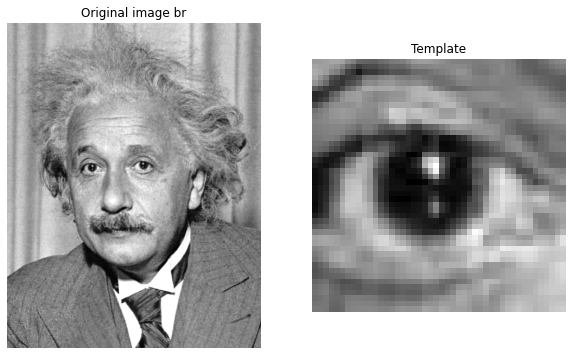

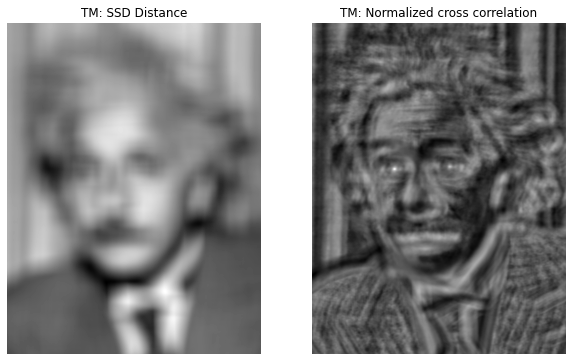

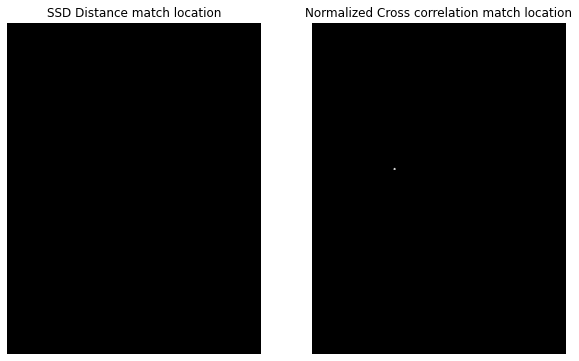

binarized TM


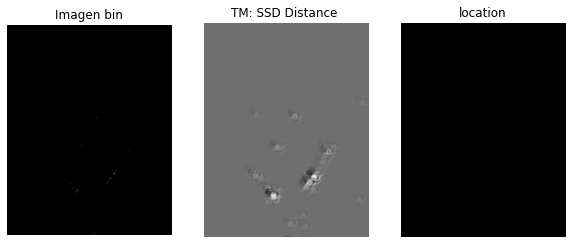

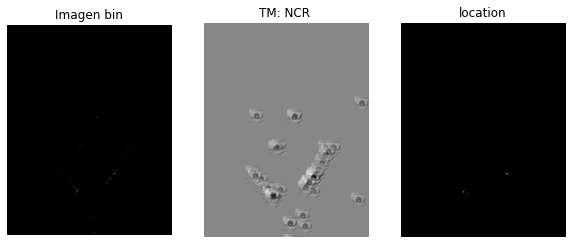

In [5]:
einsteinbr = rgb2gray(io.imread('./images/einstein_br.png'))
einsteinbr_bin = np.where(einsteinbr <= 0.2, 1, 0)


#calculate ssd and ncr
ssd = ssd_distance(einsteinbr, eye) 
ncr = normalized_correlation_match(einsteinbr, eye)

#calculate ssd and ncr with binarized image
ssd_bin = ssd_distance(einsteinbr_bin, eye) 
ncr_bin = normalized_correlation_match(einsteinbr_bin, eye)

#show results
plot_n_images(2, [einsteinbr, eye], ["Original image br", "Template"], "", 'gray')
plot_n_images(2, [ssd, ncr], ["TM: SSD Distance", "TM: Normalized cross correlation"], "", 'gray')
plot_n_images(2, [ssd < 0.2, ncr > 0.8], ["SSD Distance match location", "Normalized Cross correlation match location"], "", 'gray')
print("binarized TM")
plot_n_images(3, [einsteinbr_bin, ssd_bin, ssd_bin<0.2], ["Imagen bin", "TM: SSD Distance ","location"], "", 'gray')
plot_n_images(3, [einsteinbr_bin, ncr_bin, ncr_bin>0.8], ["Imagen bin", "TM: NCR ","location"], "", 'gray')

Print the minimum SSD and the maximum Normalized Cross-Correlation (NCC)

In [6]:
# Your solution here
print(np.min(ssd))
print(np.max(ncr))

0.24522786368679594
1.0


**1.3** Read `einstein_mask.png` and display the results on this image, using the `eye.png` template:

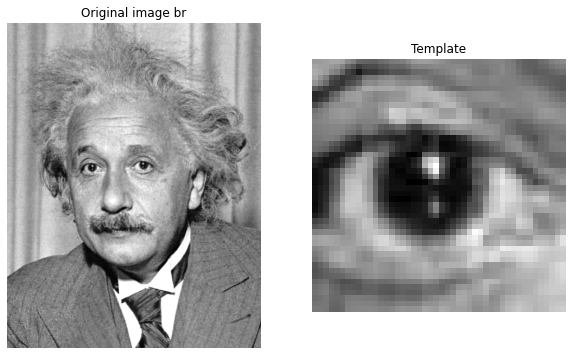

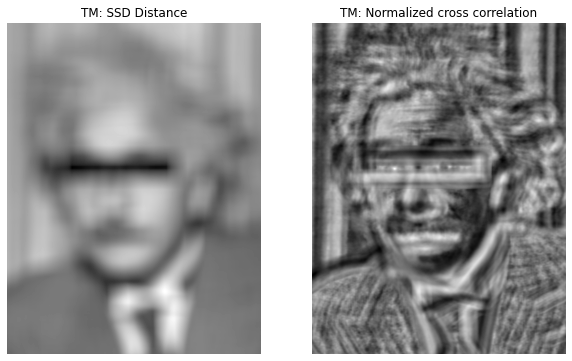

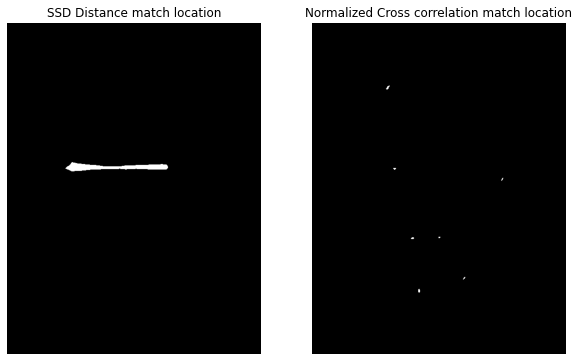

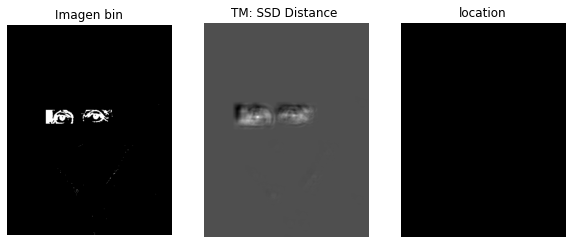

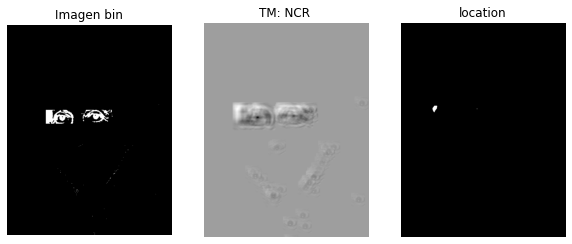

In [6]:
einstein = rgb2gray(io.imread('./images/einstein_mask.png'))
einstein_bin = np.where(einstein <= 0.2, 1, 0)

#calculate ssd and ncr
ssd = ssd_distance(einstein, eye) 
ncr = normalized_correlation_match(einstein, eye)

#calculate ssd and ncr with binarized image
ssd_bin = ssd_distance(einstein_bin, eye) 
ncr_bin = normalized_correlation_match(einstein_bin, eye)

plot_n_images(2, [einsteinbr, eye], ["Original image br", "Template"], "", 'gray')
plot_n_images(2, [ssd, ncr], ["TM: SSD Distance", "TM: Normalized cross correlation"], "", 'gray')
plot_n_images(2, [ssd < 0.2, ncr > 0.8], ["SSD Distance match location", "Normalized Cross correlation match location"], "", 'gray')
plot_n_images(3, [einstein_bin, ssd_bin, ssd_bin<0.2], ["Imagen bin", "TM: SSD Distance ","location"], "", 'gray')
plot_n_images(3, [einstein_bin, ncr_bin, ncr_bin>0.8], ["Imagen bin", "TM: NCR ","location"], "", 'gray')

Print the minimum SSD and the maximum NCC

In [7]:
print(np.min(ssd))
print(np.max(ncr))

0.037060250332487686
1.0


What are the distances between the template and the image around the eyes of the image? 

Those distances indicates the zone of the image where the algorithm will find the correct match for the template. The distances are nearly 0 as the template finds a good match.

Comment the template matching process:
* Is the algorithms affected by contrast changes in the image?
* How do metrics (i.e. minimum euclidean distance and maximum NCC) change in all previous cases? Is there a big difference among these values?
* What parameters it has and which measure for image comparisons works better.

In [10]:
# Your solution here

# 1. ssd distance algorithm is afected by contrast but ncr is not.
# 3. ncr works better using match_templates.

**1.4** How does the result of the template matching change if instead the template is the one that changes its contrast (for example if you make it clearer or darker)? To this purpose, use the `eye_br.png` template.

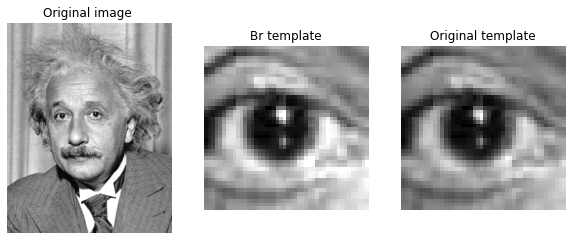

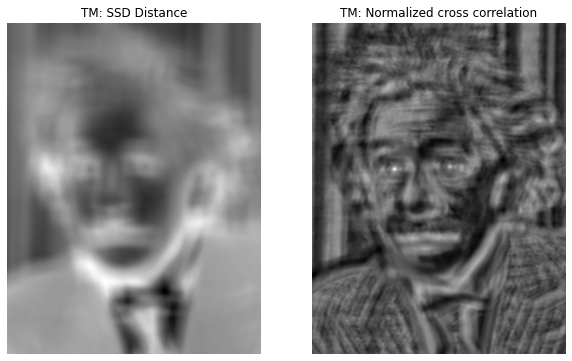

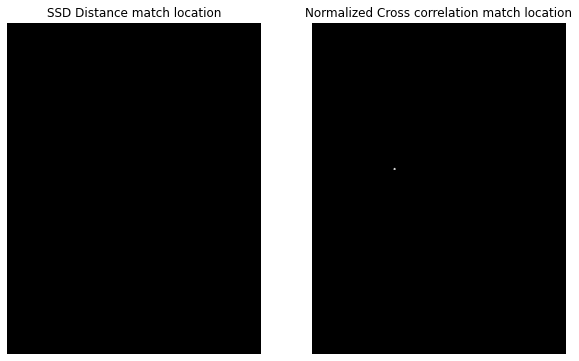

In [11]:
einstein = rgb2gray(io.imread('./images/einstein.png'))
eye_br = rgb2gray(io.imread('./images/eye_br.png'))

#calculate ssd and ncr
ssd = ssd_distance(einstein, eye_br) 
ncr = normalized_correlation_match(einstein, eye_br)


#show results
plot_n_images(3, [einsteinbr, eye_br, eye], ["Original image ", "Br template", "Original template"], "", 'gray')
plot_n_images(2, [ssd, ncr], ["TM: SSD Distance", "TM: Normalized cross correlation"], "", 'gray')
plot_n_images(2, [ssd < 0.3, ncr > 0.8], ["SSD Distance match location", "Normalized Cross correlation match location"], "", 'gray')


Check how the result changes if the template is rotated.

Visualize the template and its rotation by 2º, 5º, 10º, 15º and 20º. Obtain again the template matching using the Euclidean distance and normalized cross-correlation.

**Help:** use the function rotate() in skimage.transform

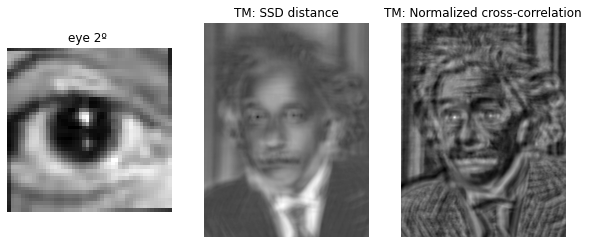

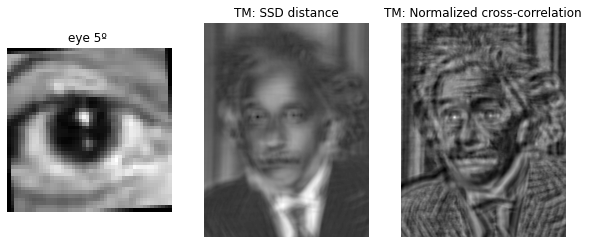

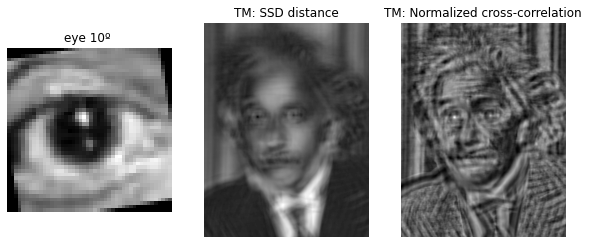

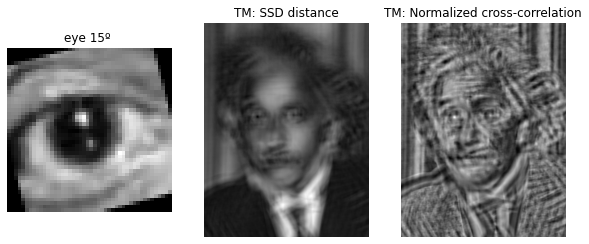

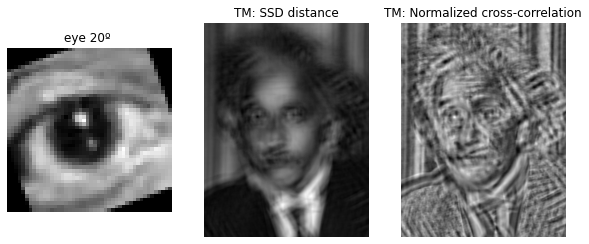

In [12]:
einstein = rgb2gray(io.imread('./images/einstein.png'))
eye = rgb2gray(io.imread('./images/eye.png'))

#eye rotations and ssd/ncr calculated
eye2, eye5, eye10, eye15, eye20 = rotate(eye, 2), rotate(eye, 5), rotate(eye, 10), rotate(eye, 15), rotate(eye, 20)
ssd2, ssd5, ssd10, ssd15, ssd20 = ssd_distance(einstein, eye2), ssd_distance(einstein, eye5),  ssd_distance(einstein, eye10),  ssd_distance(einstein, eye15),  ssd_distance(einstein, eye20)
ncr2, ncr5, ncr10, ncr15, ncr20 = normalized_correlation_match(einstein, eye2), normalized_correlation_match(einstein, eye5), normalized_correlation_match(einstein, eye10), normalized_correlation_match(einstein, eye15), normalized_correlation_match(einstein, eye20)

#show results
plot_n_images(3, [eye2, ssd2, ncr2], ["eye 2º ", "TM: SSD distance", "TM: Normalized cross-correlation"], "", 'gray')
plot_n_images(3, [eye5, ssd5, ncr5], ["eye 5º ", "TM: SSD distance", "TM: Normalized cross-correlation"], "", 'gray')
plot_n_images(3, [eye10, ssd10, ncr10], ["eye 10º ", "TM: SSD distance", "TM: Normalized cross-correlation"], "", 'gray')
plot_n_images(3, [eye15, ssd15, ncr15], ["eye 15º ", "TM: SSD distance", "TM: Normalized cross-correlation"], "", 'gray')
plot_n_images(3, [eye20, ssd20, ncr20], ["eye 20º ", "TM: SSD distance", "TM: Normalized cross-correlation"], "", 'gray')

No major changes are seen. As explained in class, normalized cross is invariant to local average intensity and contrast.

Comment the template matching process:
* Please, explain briefly the algorithm, including advantages and disadvantage
* Is the algorithms affected by contrast changes in the tempate image?
* What parameters it has and which measure for image comparisons works better.

The template matching process is a technique that allows a feature, texture or another picture to be found or identified in an image. It allows us to find different elements in an image. However it needs a good, robust and invariant similarity measure to operate perfectly. It's quite sensible to photometric deformations. Comparison: Euclidean distance is fast but very sensitive, Correlation is less sensitive to illumination changes and Normalized Cross Correlation is less sensitive to variance in the mask.

# 2 Histogram of Oriented Gradients

In this section we will treat the following topic: HOG image descriptor. Application to person detection.

The Histogram of Oriented Gradients (HOG) feature descriptor is classical image descriptor for object detection.

Given the image `person_template.bmp` and the folder `/images/TestPersonImages/`, apply the HOG descriptor in order to detect where there is a person in the images. To this purpose, apply the "sliding window" technique. We use images from GRAZ 01 data from [INRIA datasets](http://pascal.inrialpes.fr/data/human/).

**2.1.** Read the template (`person_template.bmp`), obtain its HOG descriptor (with the optimal parameters) and visualize it.

Help: the HOG detector function is in the skimage.feature library ([Help](http://scikit-image.org/docs/dev/auto_examples/features_detection/plot_hog.html#sphx-glr-auto-examples-features-detection-plot-hog-py)).

In [13]:
from skimage import img_as_float
def get_HOG(image, orientations=8, pixels_per_cell=(4, 4), cells_per_block=(3, 3), visualize=True):
    # Returns the HOG of a given image.
    
    image = img_as_float(rgb2gray(image))
    
    # Get the HOG of the previous image.
    return hog(image, orientations=8, pixels_per_cell=(4, 4), cells_per_block=(3, 3), visualize=True)[1]

In [14]:
def visualize_image_group(images, titles):
    
    """
    Given a list of images and its corresponding titles,
    shows all the images in a row with each title above.
    """
    
    f, axarr = plt.subplots(1, len(images))
    f.set_size_inches(15, 15)
    
    for i in range(len(images)):
    
        axarr[i].imshow(images[i], cmap='gray')
        axarr[i].set_title(titles[i])
        
        axarr[i].xaxis.set_visible(False)
        axarr[i].yaxis.set_visible(False)
        
    plt.show()

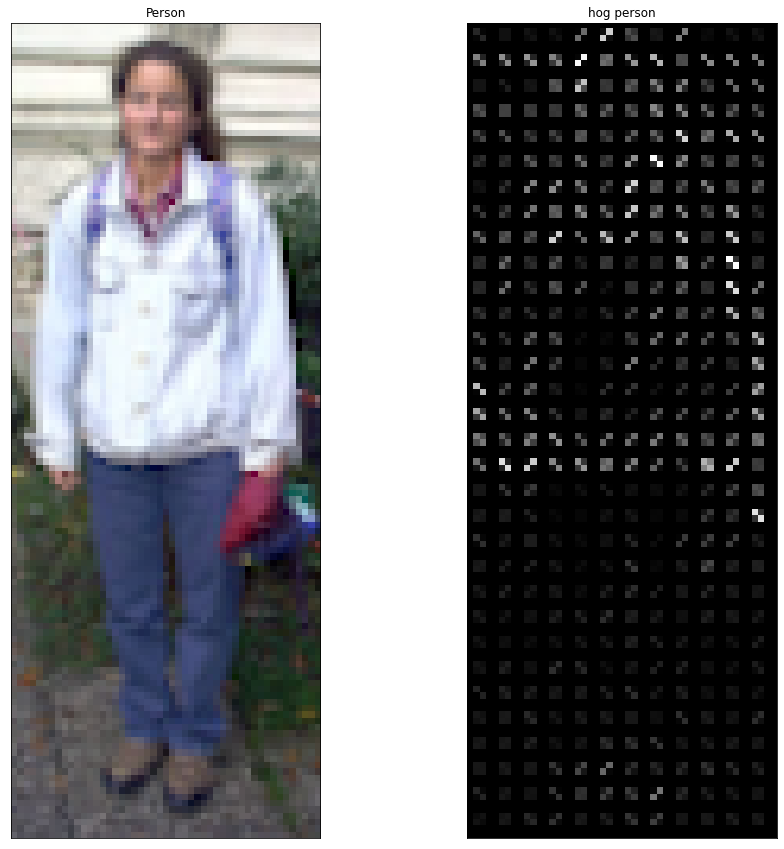

In [15]:
# Import the images.
person_template = io.imread("images/person_template.bmp")

# Store them neatly.
images = [person_template, get_HOG(person_template)]
titles = ["Person", "hog person"]

# And visualize it all.
visualize_image_group(images, titles)

**2.2.** Apply the HOG descriptor on the complete set of images for person detection.

a) Read images from the folder "TestPersonImages", slide a window on each image, obtain the HOG descriptor and compare to the HOG descriptor of the person template. 

b) Visualize the location in the image that is the most similar to the person template using the distance between the template and test image descriptors.

Display the results of every person detection following this format:

<img src="images_notebook/hog.png" width="800" height="100">

In [16]:
import matplotlib.patches as patches

def compare_hogs(template, image, orientations=8, pixels_per_cell=(4, 4), cells_per_block=(3, 3), visualize=True):
    # Generate the HOG of the template
    hog_template = get_HOG(template)
    
    # Generate the HOG of the image
    hog_image = get_HOG(image)

    dimensions = [image.shape[i] - template.shape[i] for i in range(2)]
    
    # Create a black image to put the HOG with the size of the original image
    result = np.ones([image.shape[0],image.shape[1]])
    
    data = []
    
    # Slicing with x of 5
    for i in range(0, dimensions[0], 5):
        for j in range(0, dimensions[1], 5):
            
            # Center for the result HOG to display
            posx = template.shape[0]+i-(int(template.shape[0]/2))
            posy = template.shape[1]+j-(int(template.shape[1]/2))
            
            # Get the region of the image to generate the HOG
            region = image[i:i+template.shape[0],j:j+template.shape[1]]
            hog_region_rescaled = exposure.rescale_intensity(get_HOG(region, orientations=8, pixels_per_cell=(4, 4), cells_per_block=(3, 3), visualize=True), in_range=(0,20))
            
            # Do euclidean distance with HOG of our region and our template
            hog_dis = np.linalg.norm(hog_region_rescaled - hog_template)
            result[posx,posy] = hog_dis
            
            # Save the information into the PriorityQueue
            data += [[hog_dis, [i, j]]]
        
    minimal = [min(data)[1][1], min(data)[1][0]]
    
    # Generate two rectangles for the HOG and the original image
    rect = patches.Rectangle(minimal, template.shape[1], template.shape[0], edgecolor='r', facecolor='none')
    rect1 = patches.Rectangle(minimal, template.shape[1], template.shape[0], edgecolor='r', facecolor='none')

    return [template, image, hog_image, rect, rect1]

In [17]:
def visualize_HOG(images, titles):
    
    figures, ax = plt.subplots(ncols=3, figsize=(15,20))
    ax[0].imshow(images[0], cmap='gray')
    ax[0].set_title(titles[0])
    ax[1].imshow(images[1], cmap='gray')
    ax[1].add_patch(images[3])
    ax[1].set_title(titles[1])
    ax[2].imshow(images[2], cmap='gray')
    ax[2].set_title(titles[2])
    ax[2].add_patch(images[4])
    plt.show()

Image number:  0


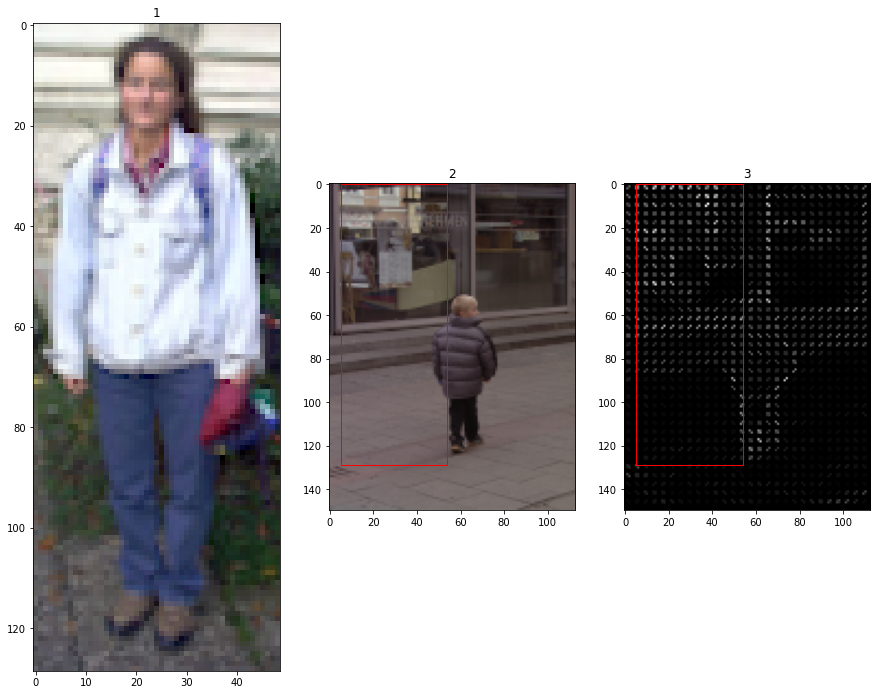

Image number:  1


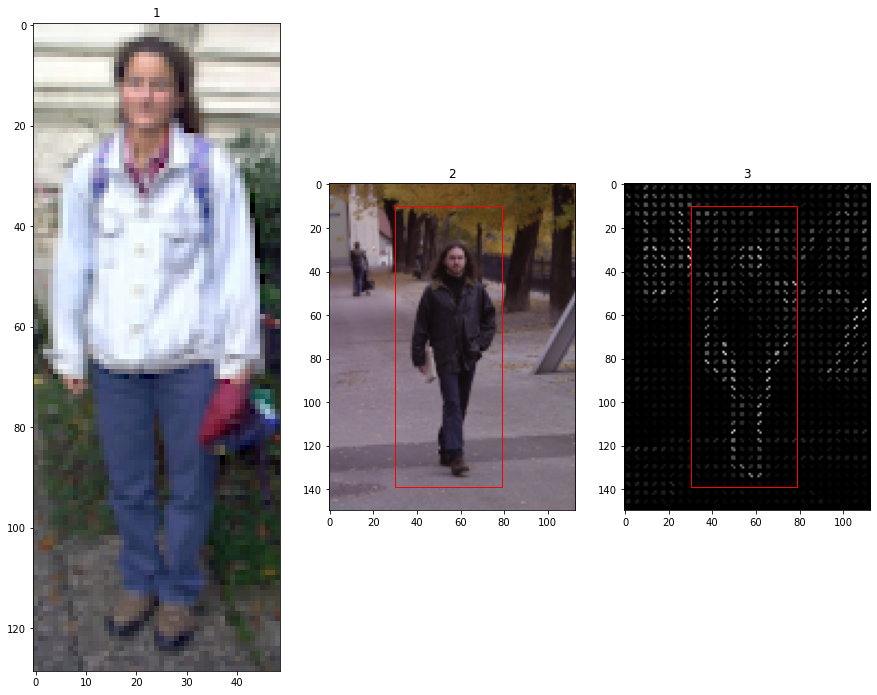

Image number:  2


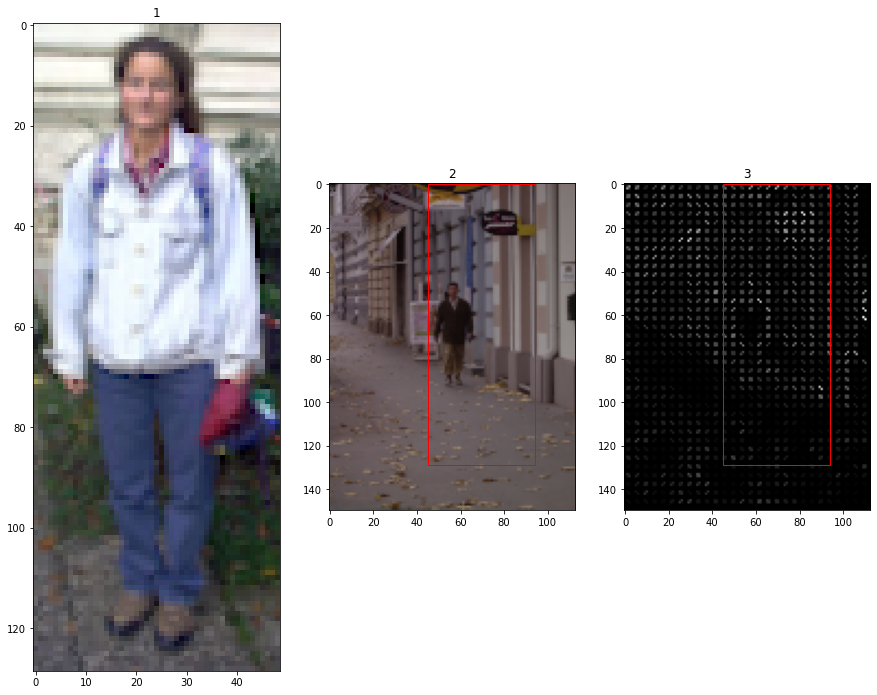

Image number:  3


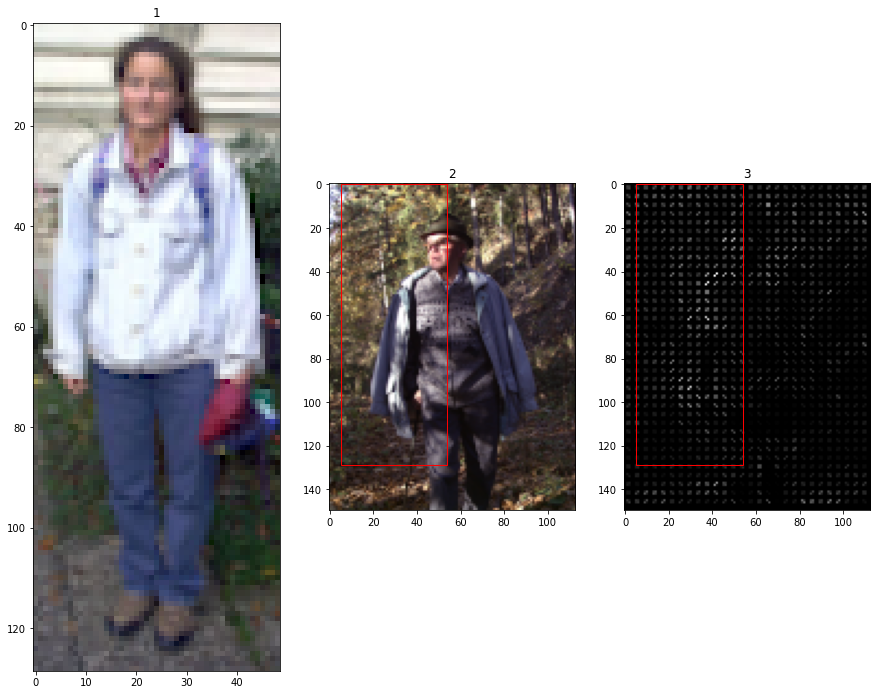

Image number:  4


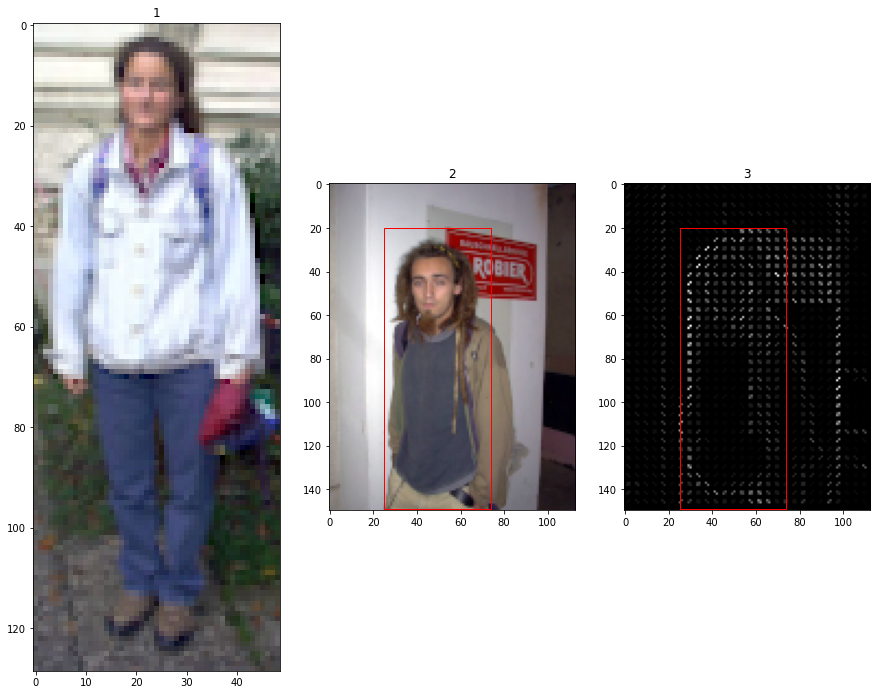

Image number:  5


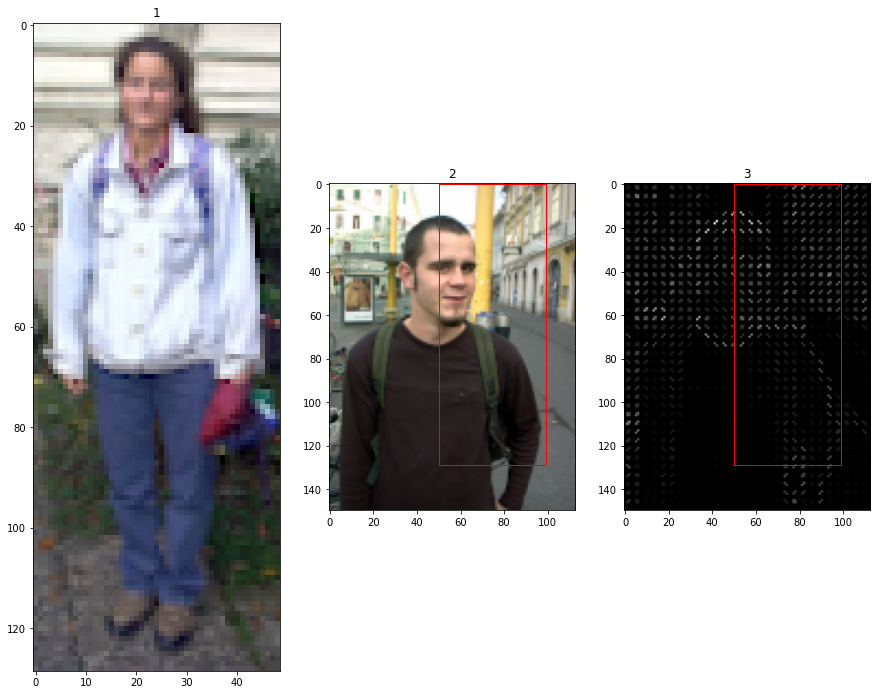

Image number:  6


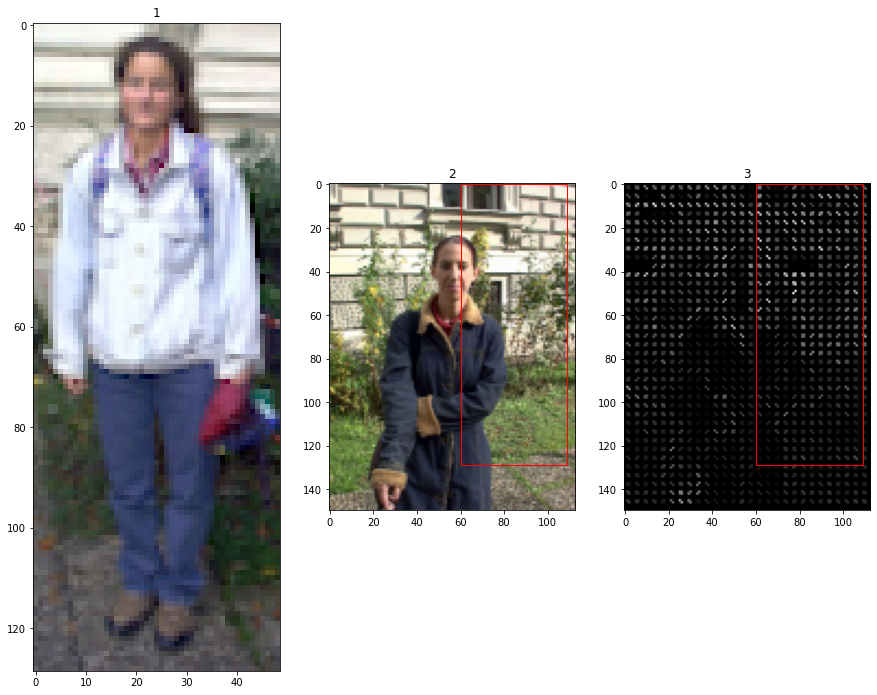

Image number:  7


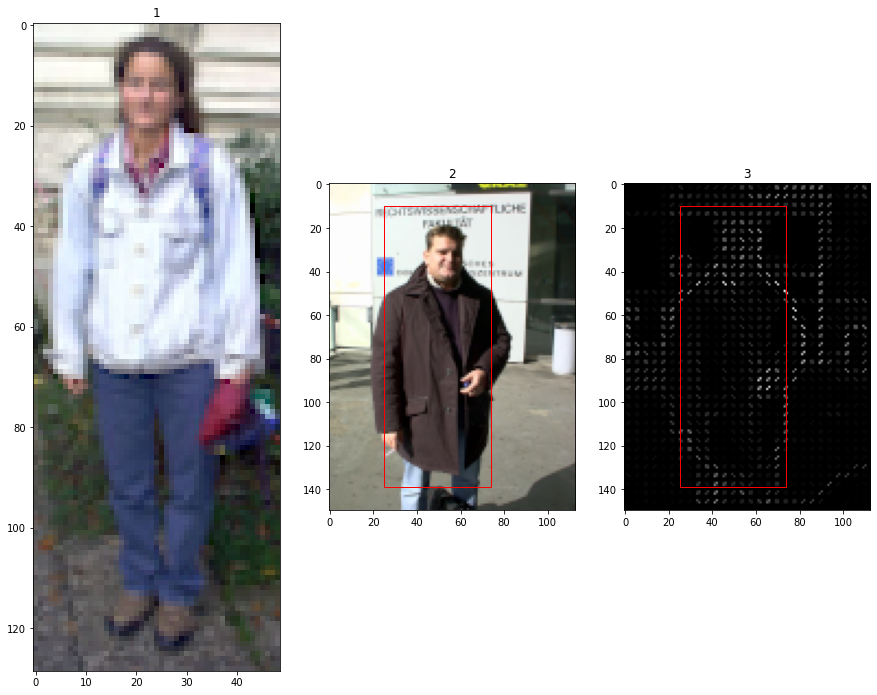

Image number:  8


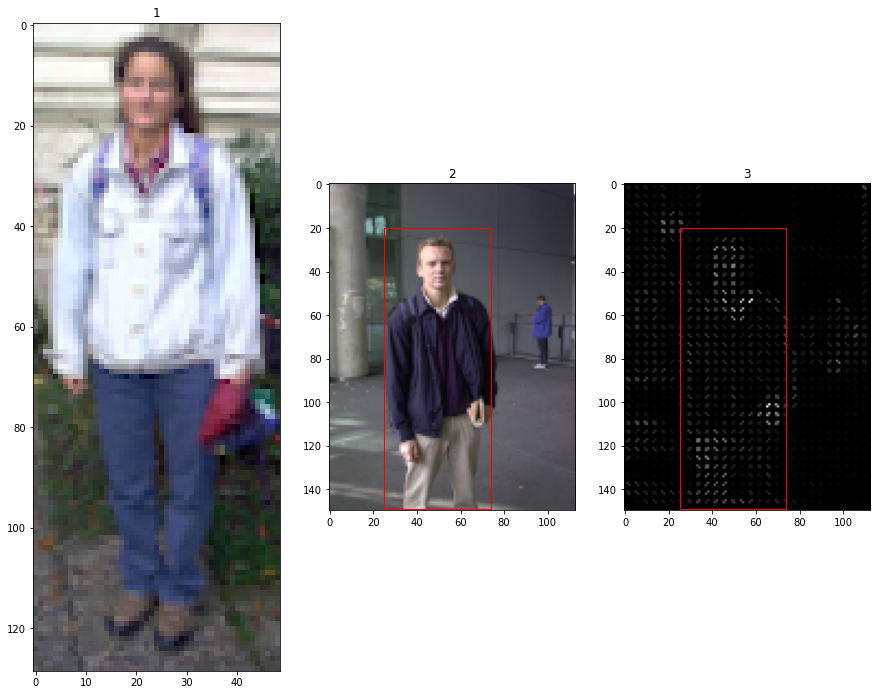

Image number:  9


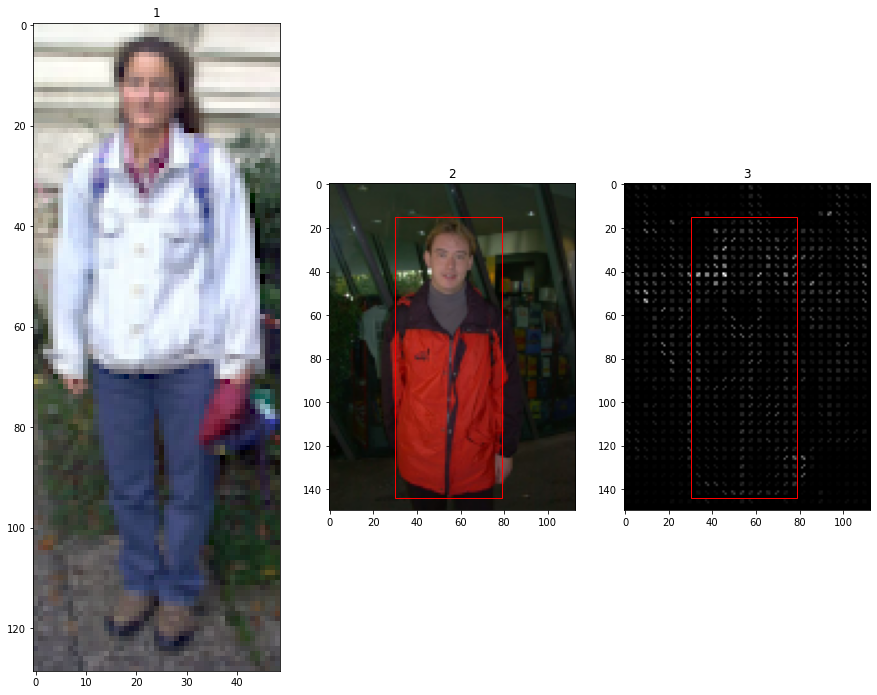

Image number:  10


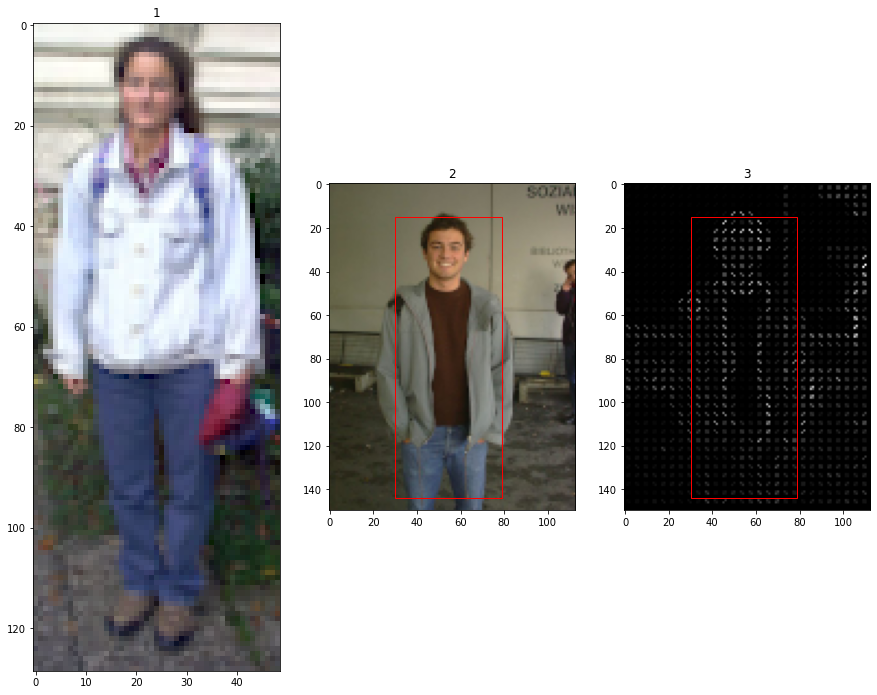

Image number:  11


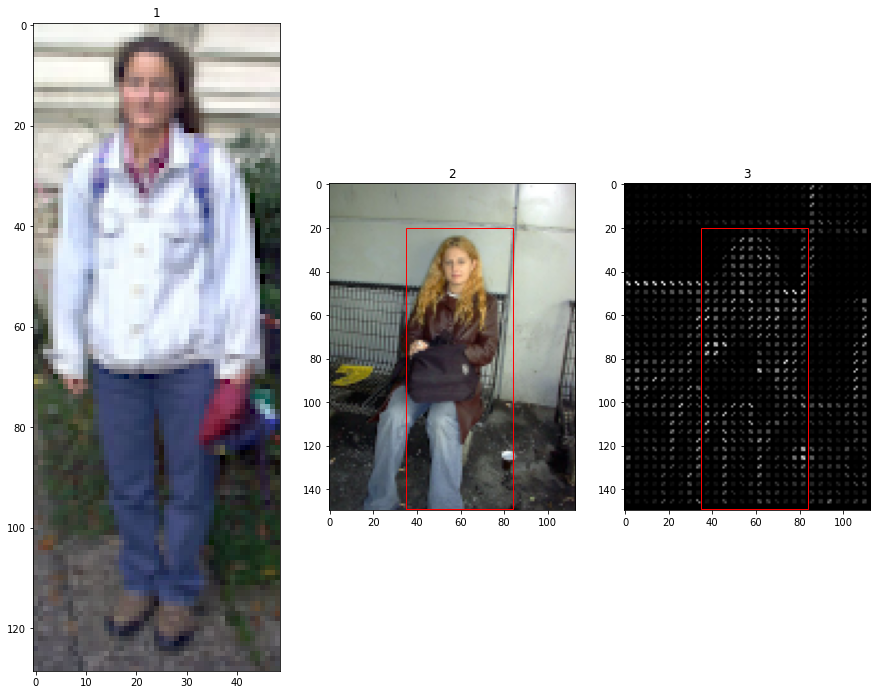

Image number:  12


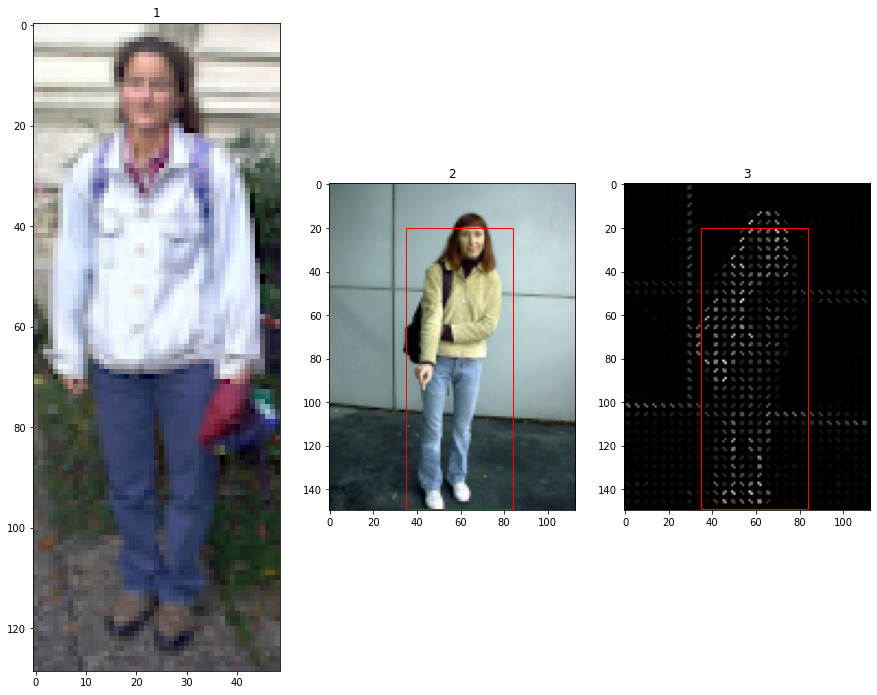

Image number:  13


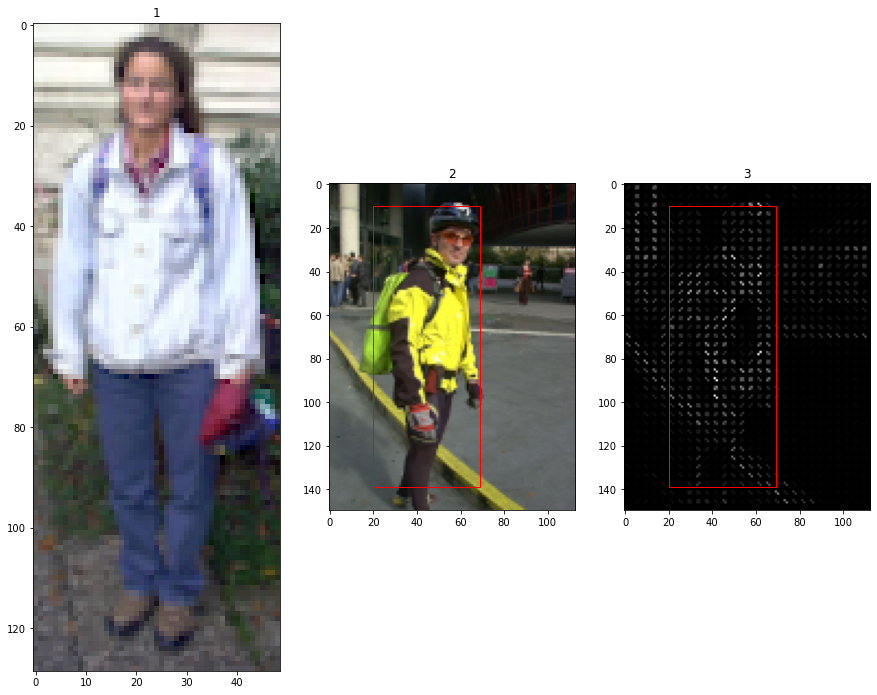

Image number:  14


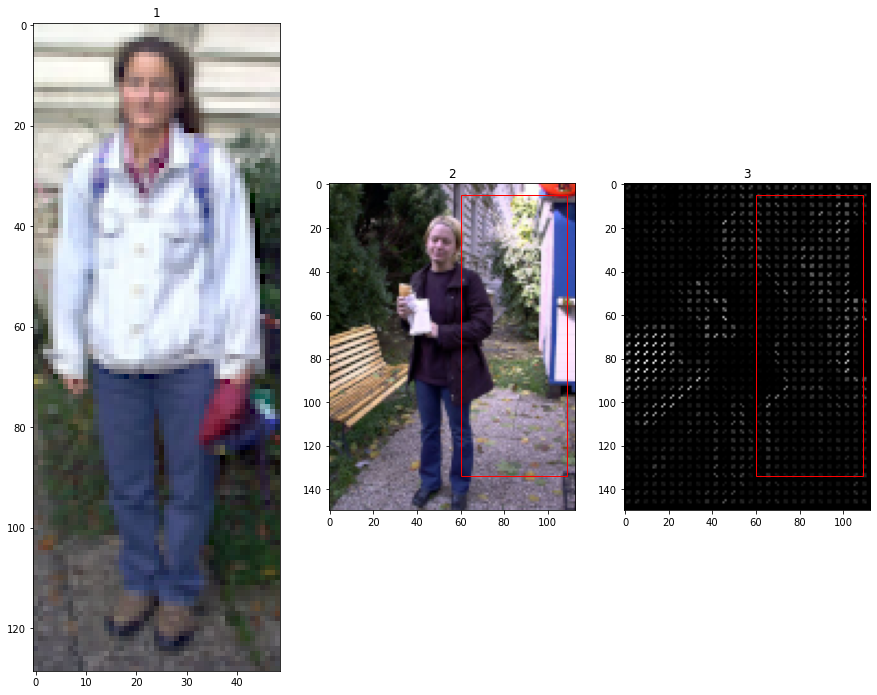

In [18]:
ic = io.ImageCollection('./images/TestPersonImages/*.bmp')
person = io.imread('./images/person_template.bmp')

for i,im in enumerate(ic):
    print("Image number: ", i)
    visualize_HOG(compare_hogs(person, im), ["1", "2", "3"])

What is the dimension of your HOG descriptor? Explain it.

In [19]:
# First we obtain the vector of the image template
print("Shape of the person template is", person_template.shape)

Shape of the person template is (129, 49, 4)


For a 129x49 image:

- Divide the image in cells of 4x4 pixels (8x16 cells)

- Group cells into blocks of 3x3 cells (12x12 pixels) of 50% overlap 

- Total number of blocks:32x12= 384

- Quantize the gradient orientation into 8 bins

- Concatenate histograms: 384 x 4 x 8 = 12288 feature vector


**Count on how many images were the persons detected correctly and discuss the failures.
What do you think can be the reasons for the failures?**

A total of 10 images out of 15 have been detected correctly, those that have not been detected correctly have been images 0, 2, 5, 6, 14. 

The main reason why some pedestrians are not detected correctly may be due to the correlation between the template and the image being analyzed, since either due to the lighting, the position of the pedestrian or its dimensions, it may not correspond to the template and not correctly detect the position of the pedestrian.

**Test several values of the parameters (``orientations``, ``pixels_per_cell``, ``cells_per_block``) to show which are the optimal values for the person detection problem.**

The HOG function from the *Skimage library* has the following basic parameters:

- orientations: Number of orientations to keep track on
- pixels_per_cells: Sets the size of a cell
- cells_per_block: Sets the number of cells for each block

Image number:  0


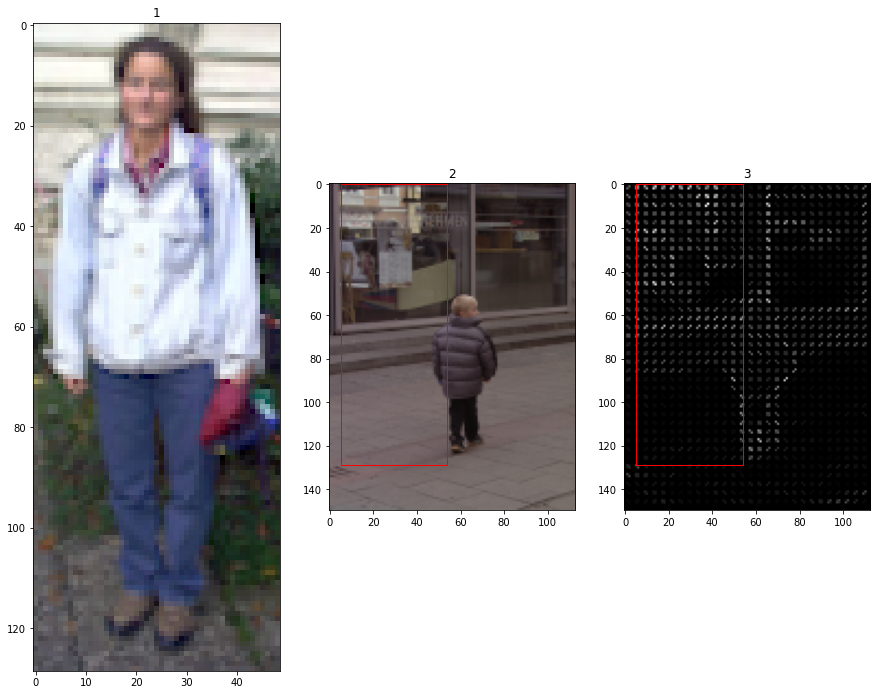

Image number:  2


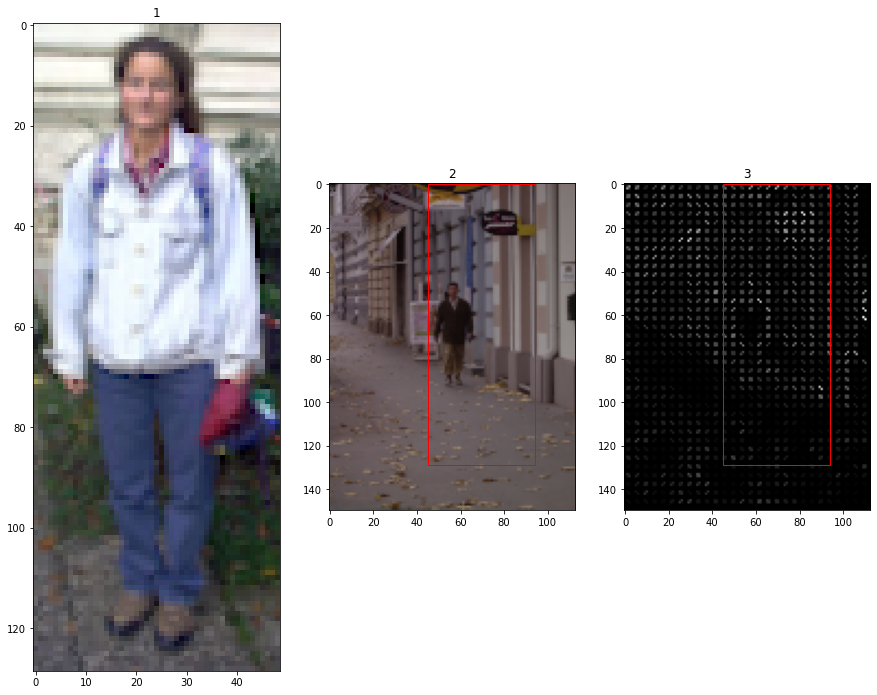

Image number:  5


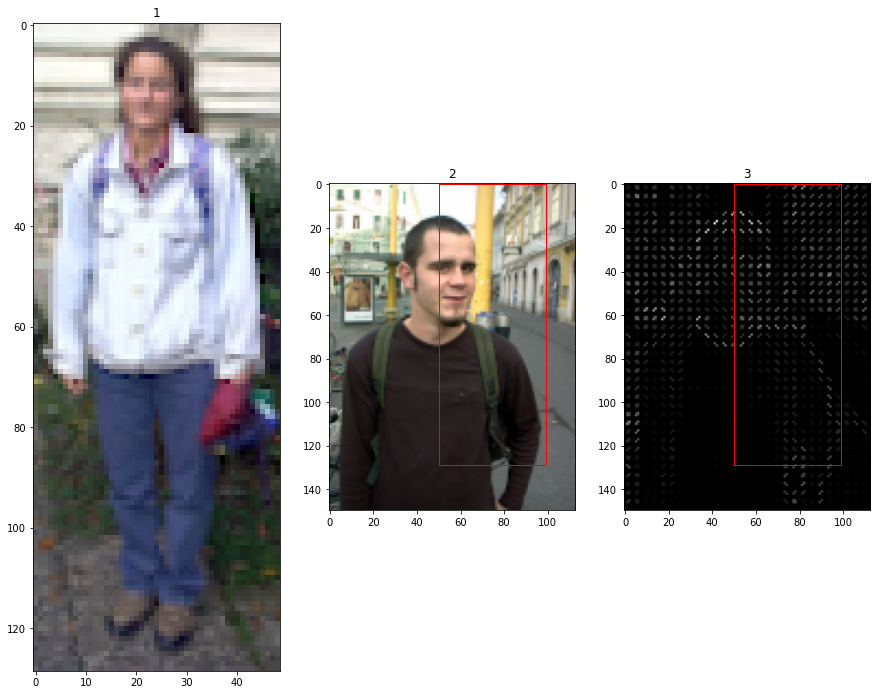

Image number:  6


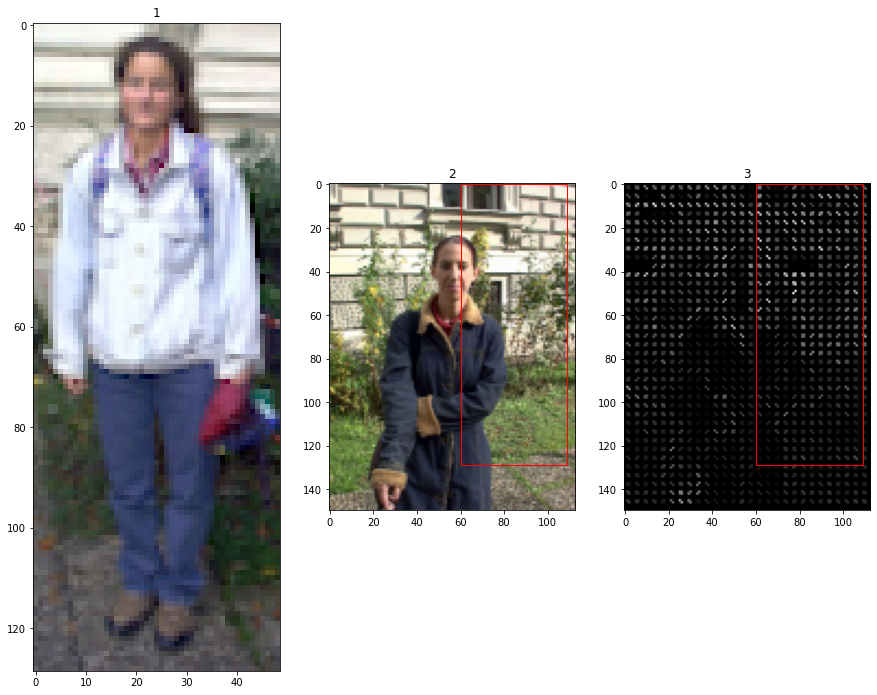

Image number:  14


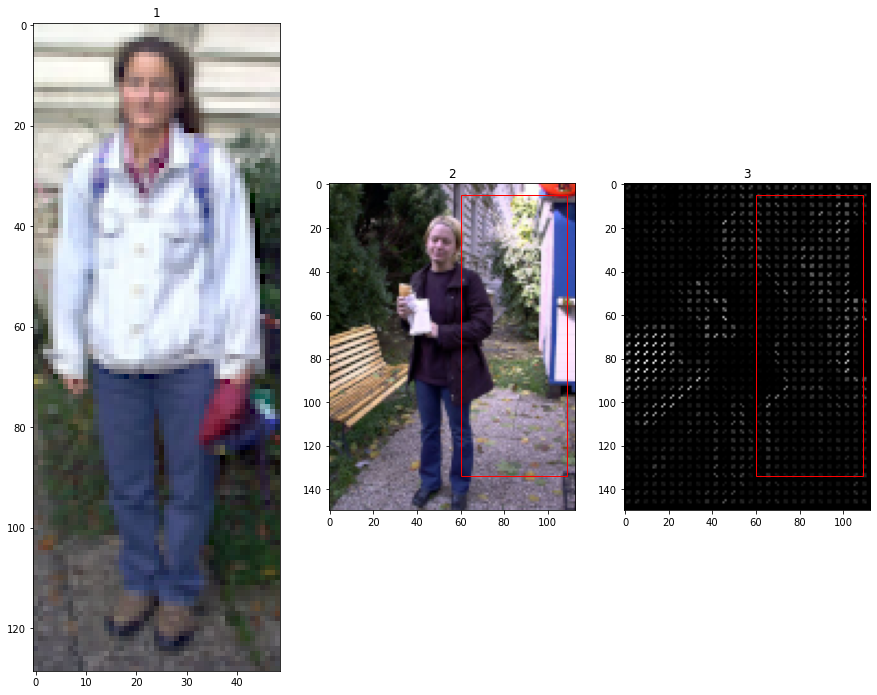

In [20]:
# For the images the pedestrians of which have not been detected correctly we use other parameters for the HOG to see 
# if there are improvements

images_to_improve = [0, 2, 5, 6, 14]
for i,im in enumerate(ic):
    if i in images_to_improve:
        print("Image number: ", i)
        visualize_HOG(compare_hogs(person, im, 100, (2, 2), (2, 2)), ["1", "2", "3"])

We have tried different parameters but it has not worked, because the main problem is the correlation between the template and the images. For example, in image 0 and 2 a boy and a man appear, the size of which it's less than that of the pedestrian in the template, therefore it does not detect them well, apart from figure 5 the lighting plays an important factor, leading to the confusion of the person with the environment due to the clothing and the background similarities in colours.

## Comment the object detection process:
* Please, explain briefly the algorithm, including advantages and disadvantage
* Do you see any advantages of the HOG-based object detector compared to the template-based object detection? (The answer should be up to 10-15 lines).

HOG descriptors are used in HOG algorithms for generating histogram gradients of regions of the image. The histograms will be used to identify in with directions the images changes.

For the pedestrian detection testing, small parameters will do the trick. Since it's relatively big and has mainly straight vertical lines, a big number isn't needed and lots of pixels per cell aren't required. For detection of smaller objects, more pixels would do the trick. In comparison to the template-based object detector, HOG is illumination invariant as well as invariant to small spatial changes which makes it better for object detection.

# 3 ORB feature detector and binary descriptor

Let us consider the problem of feature extraction that contains two subproblems: 
- feature location, 
- image feature description.

Let us focus on ORB, an approximation of SIFT method, and analyse if ORB is  scale and rotation invariant, a property that is very important for real-time applications.

**Hint:** `ORB` is a function within the module `skimage.feature`
                             
**Help**: We suggest to have a look at the [ORB example](http://scikit-image.org/docs/dev/auto_examples/features_detection/plot_orb.html) how to compute the ORB descriptors and find the descriptors match. You can use the function match_descriptors from `skimage.feature` module in order to compute and show the similar detected descriptors of the given images. 

**3.1** Detect the censure in the image `starbucks4.jpg`. Analyze and discuss the effect of different values of the parameters in censure function.

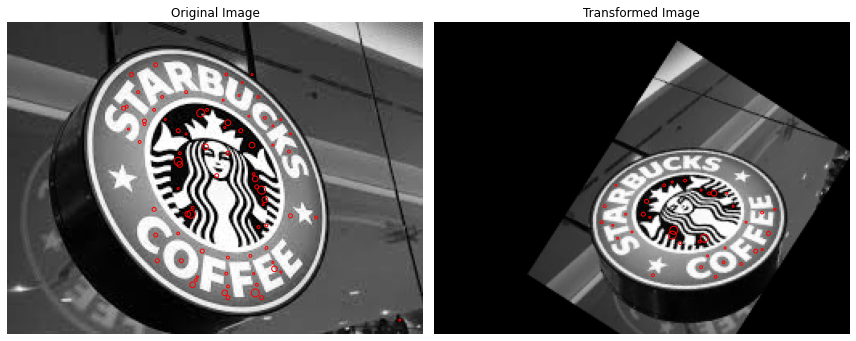

In [21]:
# Your solution here
from skimage import transform
from skimage.feature import CENSURE
from skimage.color import rgb2gray

import matplotlib.pyplot as plt

# We read the image and transform it 
img_orig = rgb2gray(io.imread('./images/starbucks4.jpg'))
tform = transform.AffineTransform(scale=(1.5, 1.5), rotation=1,
                                  translation=(150, -200))
img_warp = transform.warp(img_orig, tform)

detector = CENSURE(min_scale=1, max_scale=7, mode='Octagon', non_max_threshold=0.15, line_threshold=10)

# min_scale: (int) Minimum scale to extract keypoints from.
# max_scale: (int) Maximum scale to extract keypoints from.
# variating these 2 values we can get more or less descriptors, we have to be careful about which descriptors we want
# (for example, we dont want descriptors outside the logo in this case)
# mode: Type of bi-level filter used to get the scales of the input image. Possible values are ‘DoB’, ‘Octagon’ and ‘STAR’
# non_max_threshold: (float) Threshold value used to suppress maximas and minimas with a weak magnitude response obtained after Non-Maximal Suppression.
# line_threshold: (float) Threshold for rejecting interest points which have ratio of principal curvatures greater than this value.

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))

detector.detect(img_orig)

ax[0].imshow(img_orig, cmap=plt.cm.gray)
ax[0].scatter(detector.keypoints[:, 1], detector.keypoints[:, 0],
              2 ** detector.scales, facecolors='none', edgecolors='r')
ax[0].set_title("Original Image")

detector.detect(img_warp)

ax[1].imshow(img_warp, cmap=plt.cm.gray)
ax[1].scatter(detector.keypoints[:, 1], detector.keypoints[:, 0],
              2 ** detector.scales, facecolors='none', edgecolors='r')
ax[1].set_title('Transformed Image')

for a in ax:
    a.axis('off')

plt.tight_layout()
plt.show()

**3.2** Detect the correspondences between the model image `starbucks.jpg` with the scene image `starbucks4.jpg`. You can adapt the code from the [ORB example](http://scikit-image.org/docs/dev/auto_examples/features_detection/plot_orb.html) above. 

Define a function get_ORB implementing the algorithm in order to be able to apply it on different images. Comment the code in detail.

**Hint: If the function plot_matches() gives you an error you can use the plot_matches_aux() at the end of this file.**

Analyze and discuss the effect of different values of the parameter `max_ratio` in the match_descriptors function.


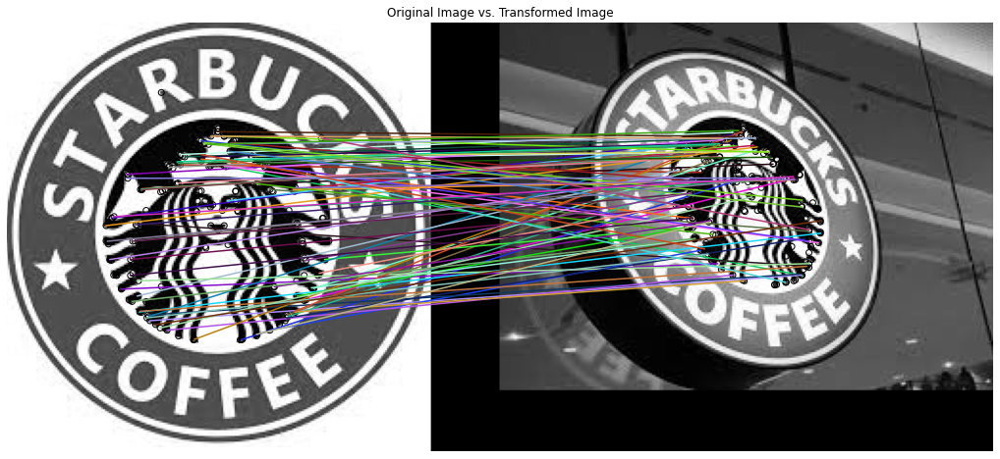

In [22]:
# Your solution here
def get_ORB(img1,img2): 
    
    # First, define the variable descriptor_extractor, with 200 key points, the same as the example.
    descriptor_extractor = ORB(n_keypoints = 200)
    
    # Now, we get the first and second image key points and descriptors, with function detect_and_extract(image).
    # First Image
    descriptor_extractor.detect_and_extract(img1)
    keypoints1 = descriptor_extractor.keypoints
    descriptors1 = descriptor_extractor.descriptors
    
    # Second Image
    descriptor_extractor.detect_and_extract(img2)
    keypoints2 = descriptor_extractor.keypoints
    descriptors2 = descriptor_extractor.descriptors

    # Now, we match de descriptors of the two images. 
    matches12 = match_descriptors(descriptors1, descriptors2, cross_check = True, max_ratio=1.0)
    # Plot the results
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize = (18, 9))
    plt.gray()
    plot_matches(ax, img1, img2, keypoints1, keypoints2, matches12)
    ax.axis('off')
    ax.set_title("Original Image vs. Transformed Image")
    plt.show()

starbucks = rgb2gray(io.imread('./images/starbucks.jpg'))  
starbucks4 = rgb2gray(io.imread('./images/starbucks4.jpg'))    
get_ORB(starbucks,starbucks4)    

# Max ratio allow us to select stronger or weaker coincidences between the descriptors of the images. If we low the treshold
# of this parameter we are going to get less matches but strongers and probably more valid ones, while highering this value,
# we are going to get more matches but some of them could be ambiguous 

Repeate the experiment comparing the `starbucks.jpg` image as a model, and showing its matches to all Starbucks images, sorting them based on their similarity to the model. Comment when does the algorithm work better. 

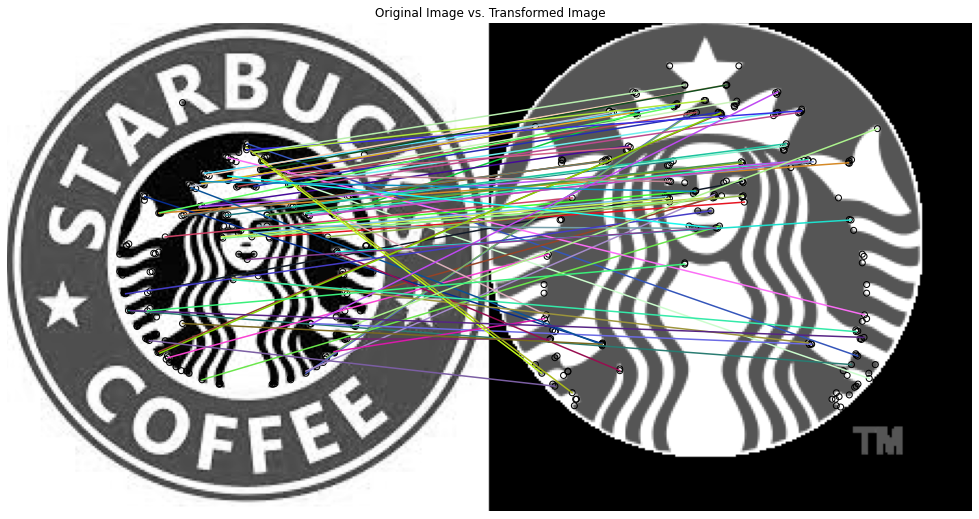

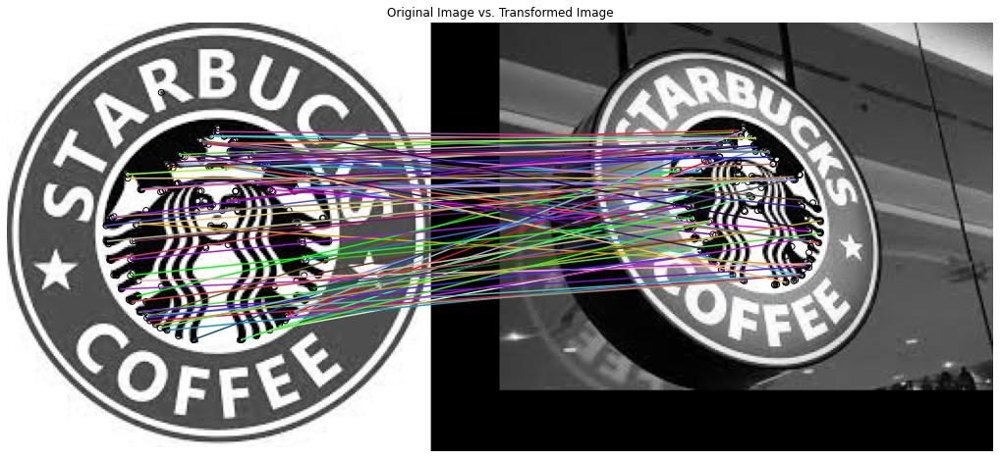

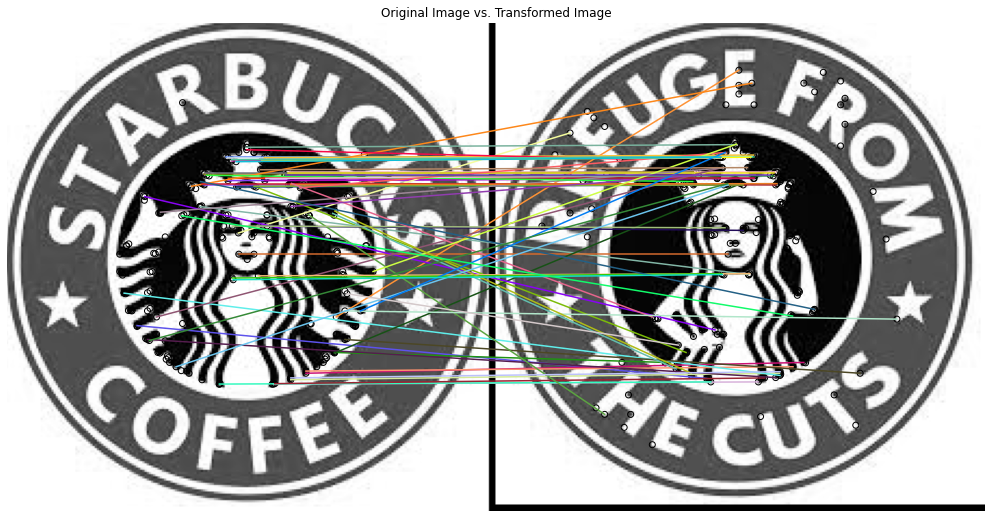

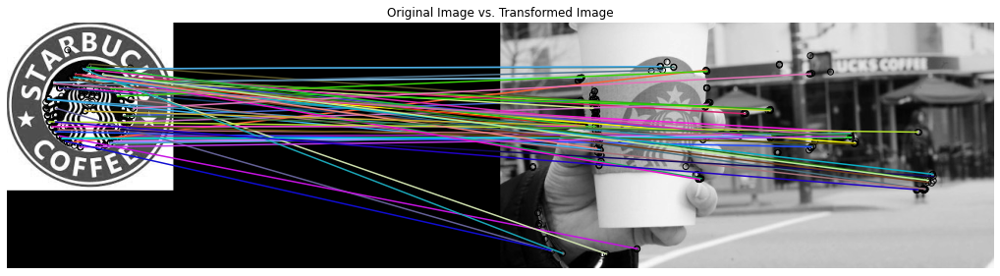

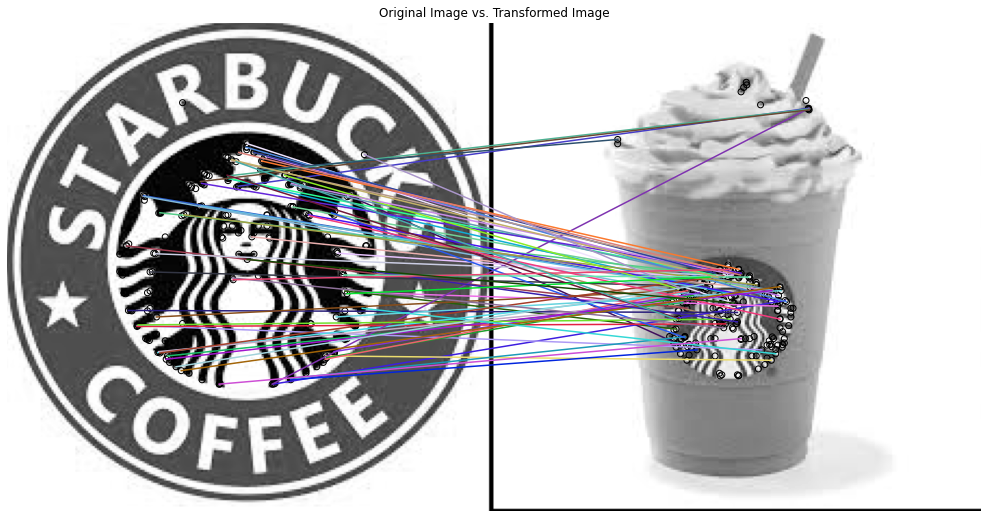

In [23]:
# Your solution here
# We first define the image "starbucks.jpg" as the model image.
model = rgb2gray(io.imread("./images/starbucks.jpg"))

# Then, we define an array where we load all the Starbucks images.
starbucks_images = [rgb2gray(io.imread("./images/starbucks2.png")),
          rgb2gray(io.imread("./images/starbucks4.jpg")), 
          rgb2gray(io.imread("./images/starbucks5.png")), 
          rgb2gray(io.imread("./images/starbucks6.jpg")),
          rgb2gray(io.imread("./images/starbucksCup.jpg"))]

# With this for-loop, we iterate over all the Starbucks images and apply the ORB function.
for i in range(len(starbucks_images)):
    get_ORB(model, starbucks_images[i])
    

# The algorithm works better when there is no foreground, Or if there is foreground this one should be plane to interfere the 
# minimum possible while matching descriptors

**3.3** Repeate the experiment: 
- Changing the orientation of the model image by rotating it and comparing it with its original version. Help: you can use the rotate() function from skimage.transform 
- Change the scale and orientation of the scene image and compare it with the model image.

**Help:** To do so, you can use the function given below as example:

```
import transform as tf
rotationdegrees = 180
img_rotated = tf.rotate(image2transform, rotationdegrees)
```

or

```
tform = tf.AffineTransform(scale=(1.2, 1.2), translation=(0, -100))
img_transformed = tf.warp(image2transform, tform)
```

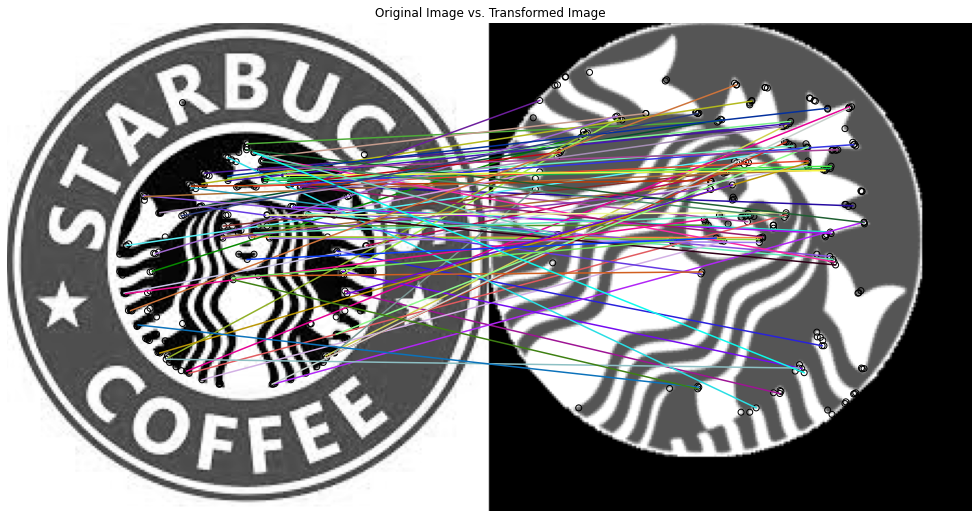

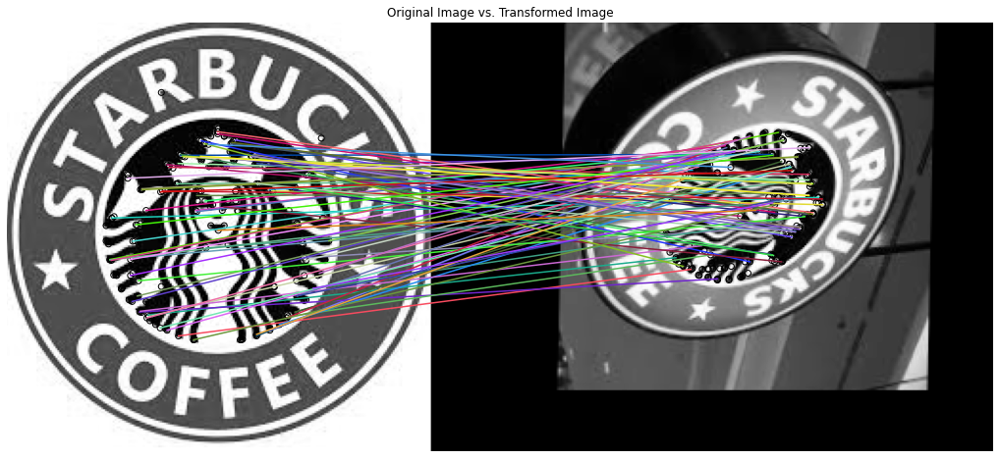

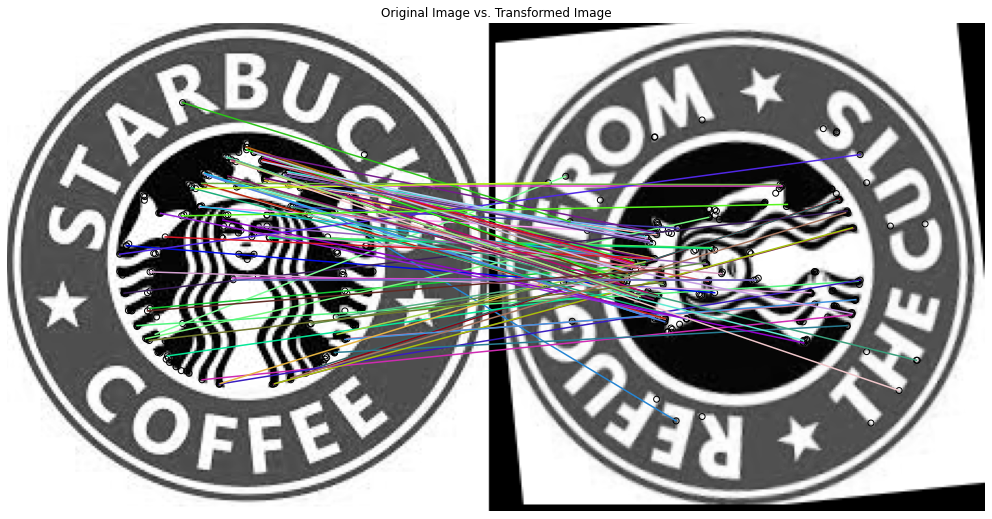

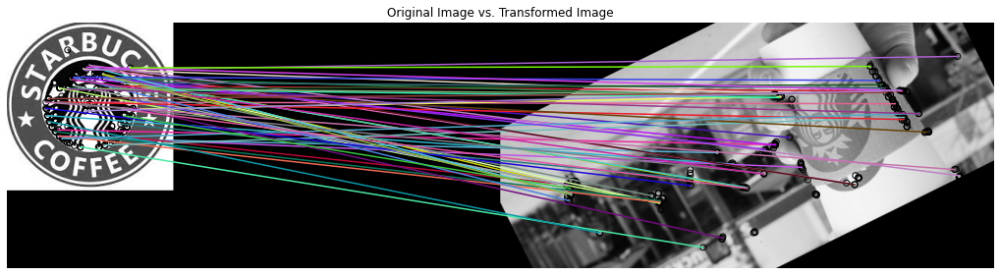

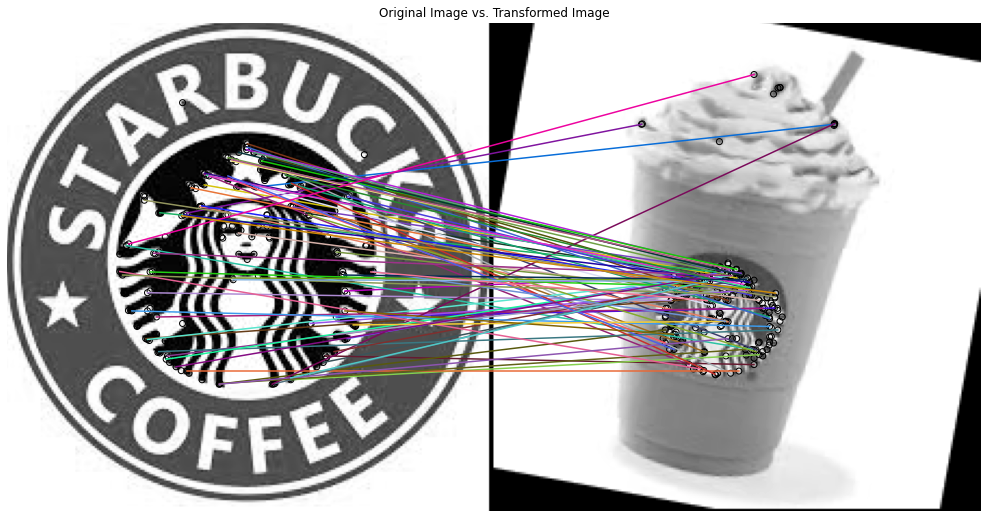

In [24]:
# Your solution here
# With this for-loop, we iterate over all the Starbucks images, apply the rotation and then the ORB function.
for i in range(len(starbucks_images)):
    actual_Image = rotate(starbucks_images[i], random.random() * 360) # We use random(), to randomly choose the degree of rotation.
    get_ORB(model, actual_Image)

**(Optional)** Repeat the experiment (3.1 to 3.3) with a new group of images. You could use Coca-Cola advertisements or from another famous brand, easily to find on internet.


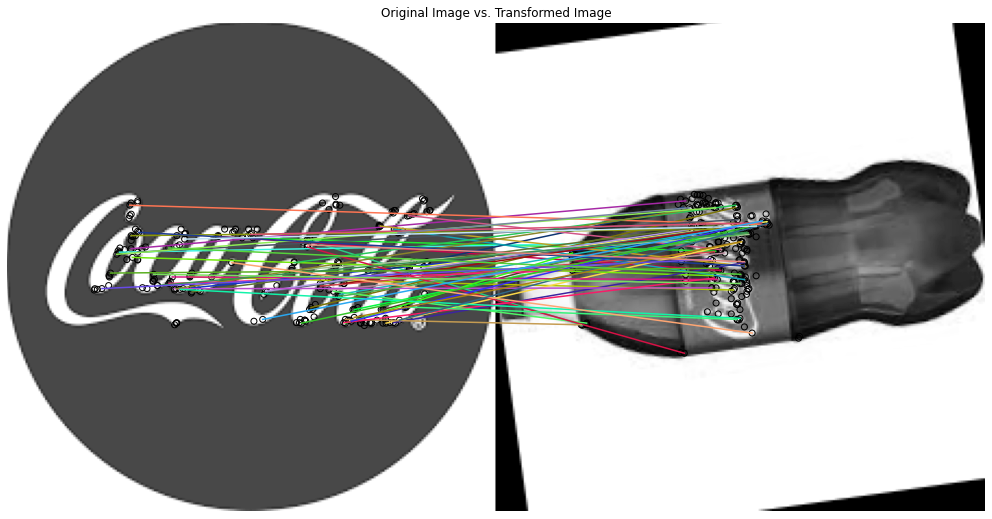

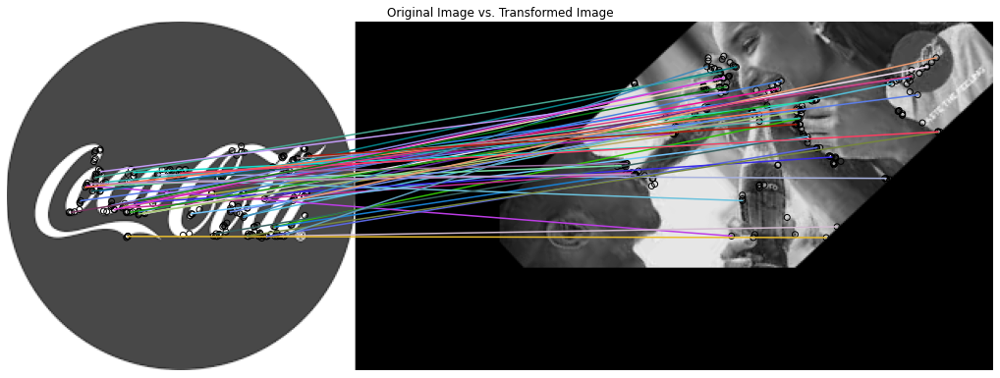

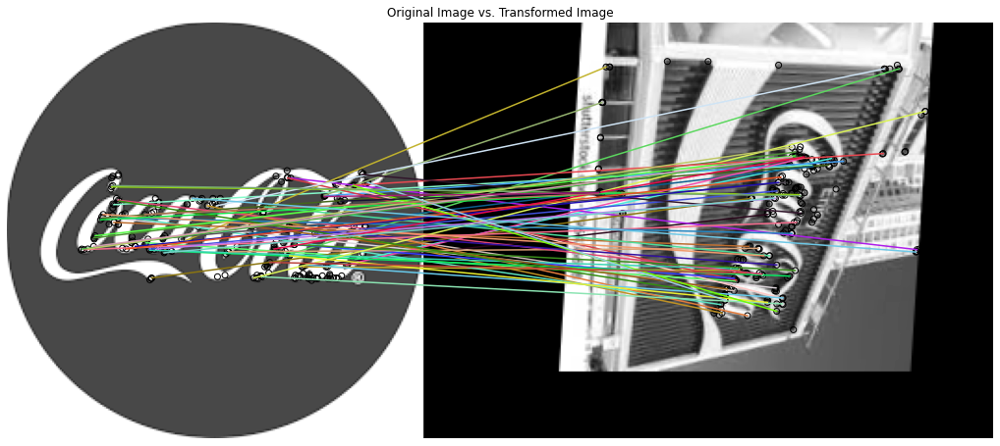

In [25]:
# Your solution here
# We first define the image "coca" as the model image.
model = rgb2gray(io.imread("./images/cocacola_logo.png"))

# Then, we define an array where we load all the Cocacola images.
cocacola_images = [rgb2gray(io.imread("./images/cocacola2.jpg")),
          rgb2gray(io.imread("./images/cocacola3.jpg")), 
          rgb2gray(io.imread("./images/cocacola4.jpg"))]

# With this for-loop, we iterate over all the Starbucks images and apply the ORB function.
for i in range(len(cocacola_images)):
    actual_Image = rotate(cocacola_images[i], random.random() * 360)
    get_ORB(model, actual_Image)

**3.4** Analysis of the applied techniques and results

- What are the advantages of the ORB object detection with respect to the HOG and template object detector?

- What would happen if you analyse an image that does not contain the Starbucks logo? 

- Could you think of ways of defining a quality measure for the correspondance between two images? (no need of implementing it) 

In [26]:
# Your solution here

# 1. The difference between the two methods is that ORB is rotation invariant and HOG and template object detector don't 
# have this feature. Other key advantatge between those algorithms, is that ORB is able to find the most important 
# points of the image to compare them with another image.

# 2. The algorithm will work the same way; it will be able to find key points and create matches. However, in reality they
# will not correspond to each other. So, we will get a wrong result.

#3. we could check if the lines the key points are parallel. If they are those 2 key points would be a strong match.


### Appendix

In [27]:
# In case the plot_matches() function gives you some problems, you can use the following one:

from skimage.util import img_as_float
import numpy as np

def plot_matches_aux(ax, image1, image2, keypoints1, keypoints2, matches,
                 keypoints_color='k', matches_color=None, only_matches=False):
    """Plot matched features.
    Parameters
    ----------
    ax : matplotlib.axes.Axes
        Matches and image are drawn in this ax.
    image1 : (N, M [, 3]) array
        First grayscale or color image.
    image2 : (N, M [, 3]) array
        Second grayscale or color image.
    keypoints1 : (K1, 2) array
        First keypoint coordinates as ``(row, col)``.
    keypoints2 : (K2, 2) array
        Second keypoint coordinates as ``(row, col)``.
    matches : (Q, 2) array
        Indices of corresponding matches in first and second set of
        descriptors, where ``matches[:, 0]`` denote the indices in the first
        and ``matches[:, 1]`` the indices in the second set of descriptors.
    keypoints_color : matplotlib color, optional
        Color for keypoint locations.
    matches_color : matplotlib color, optional
        Color for lines which connect keypoint matches. By default the
        color is chosen randomly.
    only_matches : bool, optional
        Whether to only plot matches and not plot the keypoint locations.
    """

    image1 = img_as_float(image1)
    image2 = img_as_float(image2)

    new_shape1 = list(image1.shape)
    new_shape2 = list(image2.shape)

    if image1.shape[0] < image2.shape[0]:
        new_shape1[0] = image2.shape[0]
    elif image1.shape[0] > image2.shape[0]:
        new_shape2[0] = image1.shape[0]

    if image1.shape[1] < image2.shape[1]:
        new_shape1[1] = image2.shape[1]
    elif image1.shape[1] > image2.shape[1]:
        new_shape2[1] = image1.shape[1]

    if new_shape1 != image1.shape:
        new_image1 = np.zeros(new_shape1, dtype=image1.dtype)
        new_image1[:image1.shape[0], :image1.shape[1]] = image1
        image1 = new_image1

    if new_shape2 != image2.shape:
        new_image2 = np.zeros(new_shape2, dtype=image2.dtype)
        new_image2[:image2.shape[0], :image2.shape[1]] = image2
        image2 = new_image2

    image = np.concatenate([image1, image2], axis=1)

    offset = image1.shape

    if not only_matches:
        ax.scatter(keypoints1[:, 1], keypoints1[:, 0],
                   facecolors='none', edgecolors=keypoints_color)
        ax.scatter(keypoints2[:, 1] + offset[1], keypoints2[:, 0],
                   facecolors='none', edgecolors=keypoints_color)

    ax.imshow(image, interpolation='nearest', cmap='gray')
    ax.axis((0, 2 * offset[1], offset[0], 0))

    for i in range(matches.shape[0]):
        idx1 = matches[i, 0]
        idx2 = matches[i, 1]

        if matches_color is None:
            color = np.random.rand(3)
        else:
            color = matches_color

        ax.plot((keypoints1[idx1, 1], keypoints2[idx2, 1] + offset[1]),
                (keypoints1[idx1, 0], keypoints2[idx2, 0]),
                '-', color=color)